# Bedmap3 Grids
**Description:**  Gridded data in EPSG 3031 projection. Topographic layers, uncertainties, and masks.

**Dataset:** 

Pritchard, H., Fretwell, P., Fremand, A., Bodart, J., Kirkham, J., Aitken, A., Bamber, J., Bell, R., Bianchi, C., Bingham, R., Blankenship, D., Casassa, G., Catania, G., Christianson, K., Conway, H., Corr, H., Cui, X., Damaske, D., Damn, V., ... Zirizzotti, A. (2024). BEDMAP3 - Ice thickness, bed and surface elevation for Antarctica - gridding products (Version 1.0) [Data set]. NERC EDS UK Polar Data Centre. https://doi.org/10.5285/2d0e4791-8e20-46a3-80e4-f5f6716025d2

**Associated paper:** 

Pritchard, H.D., Fretwell, P.T., Fremand, A.C. et al. Bedmap3 updated ice bed, surface and thickness gridded datasets for Antarctica. Sci Data 12, 414 (2025). https://doi.org/10.1038/s41597-025-04672-y

In [ ]:
%%capture
%load_ext autoreload
%autoreload 2


import polartoolkit as ptk

In [ ]:
layer_names = [
    # topographies
    "surface",
    "icebase",
    "bed",
    # thicknesses
    "ice_thickness",
    "water_thickness",
    # uncertainties
    "bed_uncertainty",
    "ice_thickness_uncertainty",
    # others
    "mask",
]

grids = []
for name in layer_names:
    data = ptk.fetch.bedmap3(
        layer=name,
        # available options
        spacing=5e3,  # if >=5km, will use preprocessed grid
        # region,
        # registration, # "g" for gridline or "p" for pixel
        # reference, # "eigen-gl04c" or "ellipsoid"
        # fill_nans, # True or False
    )
    grids.append(data)
    print(f"Info for {name}")
    _ = ptk.get_grid_info(data, print_info=True)
    print("##########")

Info for surface


grid spacing: 5000.0 m
grid region: (-3330000.0, 3330000.0, -3330000.0, 3330000.0)
grid zmin: 1.0
grid zmax: 4525.55419922
grid registration: g
##########


Info for icebase


grid spacing: 5000.0 m
grid region: (-3330000.0, 3330000.0, -3330000.0, 3330000.0)
grid zmin: -2739.96655273
grid zmax: 4374.48388672
grid registration: g
##########


Info for bed


grid spacing: 5000.0 m
grid region: (-3330000.0, 3330000.0, -3330000.0, 3330000.0)
grid zmin: -7210.97998047
grid zmax: 4374.51806641
grid registration: g
##########


Info for ice_thickness


grid spacing: 5000.0 m
grid region: (-3330000.0, 3330000.0, -3330000.0, 3330000.0)
grid zmin: 0.0
grid zmax: 4701.19580078
grid registration: g
##########


Info for water_thickness


grid spacing: 5000.0 m
grid region: (-3330000.0, 3330000.0, -3330000.0, 3330000.0)
grid zmin: 0.0
grid zmax: 2823.16430664
grid registration: g
##########


Info for bed_uncertainty


grid spacing: 5000.0 m
grid region: (-3330000.0, 3330000.0, -3330000.0, 3330000.0)
grid zmin: 7.0
grid zmax: 305.014251709
grid registration: g
##########


Info for ice_thickness_uncertainty


grid spacing: 5000.0 m
grid region: (-3330000.0, 3330000.0, -3330000.0, 3330000.0)
grid zmin: 0.0
grid zmax: 271.448181152
grid registration: g
##########


Info for mask


grid spacing: 5000.0 m
grid region: (-3330000.0, 3330000.0, -3330000.0, 3330000.0)
grid zmin: 1.0
grid zmax: 4.0
grid registration: g
##########


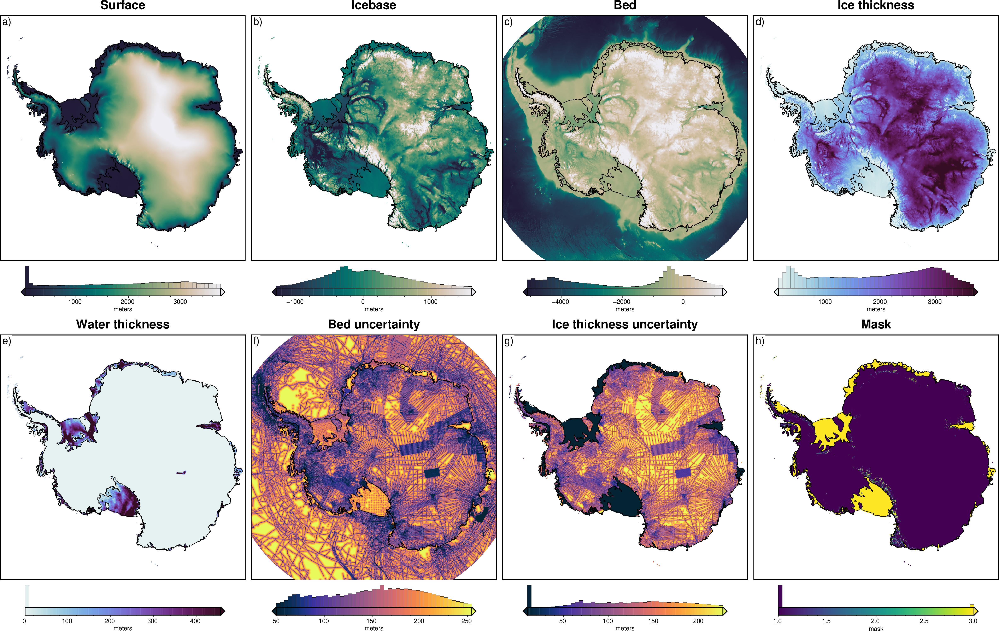

In [ ]:
titles = [
    "Surface",
    "Icebase",
    "Bed",
    "Ice thickness",
    "Water thickness",
    "Bed uncertainty",
    "Ice thickness uncertainty",
    "Mask",
]
cmaps = [
    "rain",
    "rain",
    "rain",
    "dense",
    "dense",
    "thermal",
    "thermal",
    "viridis",
]
cbar_labels = ["meters"] * 7 + ["mask"]

reverse_cpts = [True] * 3 + [False] * 5

fig = ptk.subplots(
    grids,
    titles=titles,
    cmaps=cmaps,
    reverse_cpts=reverse_cpts,
    cbar_labels=cbar_labels,
    region=ptk.regions.antarctica,
    hist=True,
    coast=True,
    robust=True,
    hemisphere="south",
)
fig.show(dpi=200)